# **Lab 6 Hyperparameter Tuning**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset,Dataset

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import os
import cv2
import glob
from skimage.util import random_noise
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

seed = 4912
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.

In [2]:
### START CODE HERE ###
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, gauss_noise=False, gauss_blur=None, resize=128, p=0.5, noise_factor=0.0, noise_std=0.0):
        self.p = p
        self.resize = resize
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.noise_factor = float(noise_factor)
        self.noise_std = float(noise_std)
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((self.resize, self.resize)),
            transforms.ToTensor()
        ])
        self.image_paths = image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        gt_image = self.transform(image)
        noisy_image = gt_image.clone()
        # Apply Gaussian blur with probability p
        if self.gauss_blur and random.random() < self.p:
            ksize = random.choice([k for k in range(3, 12, 2)])
            img_np = gt_image.permute(1,2,0).numpy() * 255
            img_np = img_np.astype(np.uint8)
            img_np = cv2.GaussianBlur(img_np, (ksize, ksize), 0)
            noisy_image = torch.from_numpy(img_np).permute(2,0,1).float() / 255.0
        # Apply Gaussian noise with probability p
        if self.gauss_noise and random.random() < self.p:
            mean = self.noise_factor
            std = self.noise_std
            img_np = noisy_image.permute(1,2,0).cpu().numpy()
            # noise = np.random.normal(loc=mean, scale=std, size=img_np.shape)
            noise = self.noise_factor * np.random.normal(loc=0.0, scale=std, size=img_np.shape)
            img_np = img_np + noise
            img_np = np.clip(img_np, 0, 1)
            noisy_image = torch.from_numpy(img_np).permute(2,0,1).float()
        return noisy_image, gt_image
### END CODE HERE ###


In [3]:
### START CODE HERE ###
def imshow_grid(images):
    _, axes = plt.subplots(4, 4, figsize=(15, 15))
    for ax, img in zip(axes.flatten(), images):
        ax.imshow(img.permute(1, 2, 0).detach().cpu().numpy())
        ax.axis('off')
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

In [4]:
### START CODE HERE ###
data_dir = "./img_align_celeba"
dataset = CustomImageDataset(image_paths=glob.glob(os.path.join(data_dir, '*.jpg')),
                             gauss_noise=True,
                             gauss_blur=True,
                             resize=128,
                             p=0.3,
                             noise_factor=0.2,
                             noise_std=0.2)
dataloader = DataLoader(dataset, batch_size=16)
### END CODE HERE ##

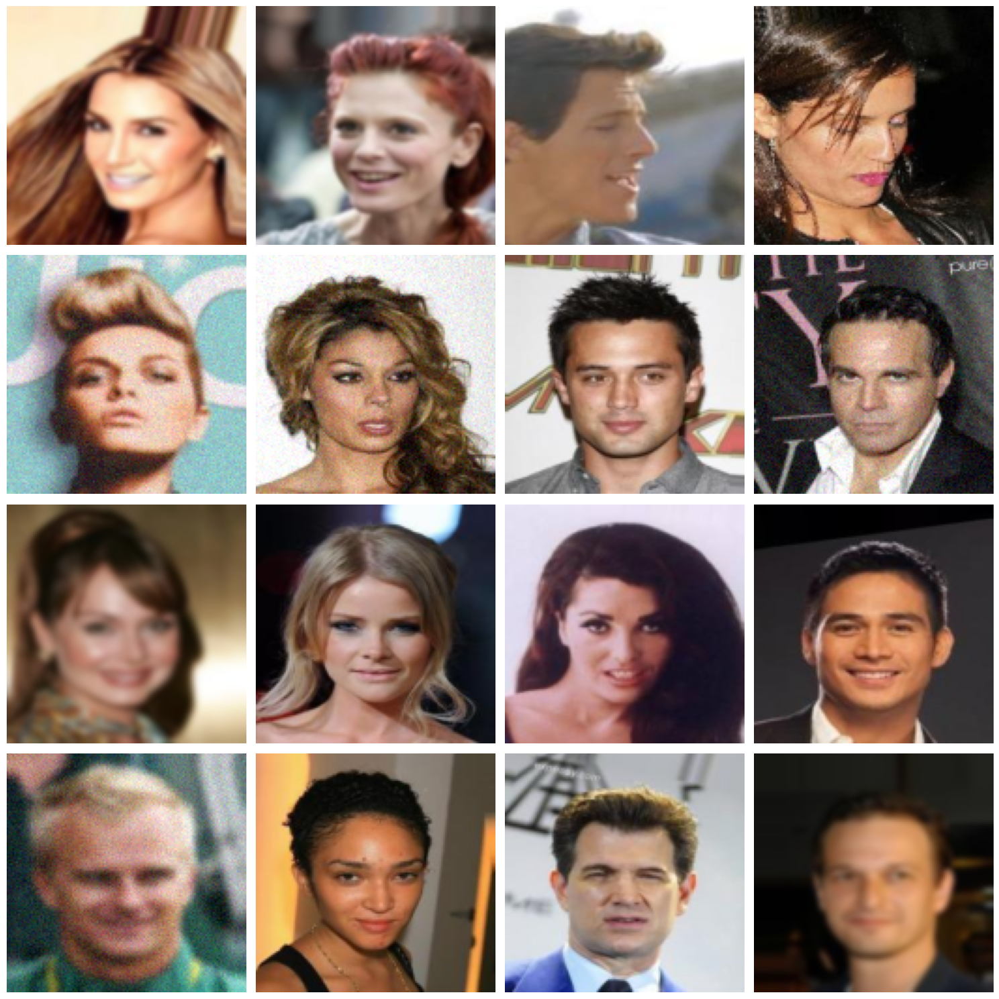

In [5]:
### START CODE HERE ###
batch,gt_img = next(iter(dataloader)) 

# imshow_grid(gt_img)
imshow_grid(batch)
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model with a customizable number of downsampling and upsampling blocks by passing a list of channel numbers for each layer based on the provided code below. However, please maintain the concept of 'Autoencoder'.

In [3]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x


class Autoencoder(nn.Module):
    def __init__(self, channels=[64, 128, 256], input_channels=3, output_channels=3):
        super().__init__()
        # Input Layer
        self.channels = channels
        self.input_conv = nn.Conv2d(input_channels, channels[0], kernel_size=3, stride=1, padding=1)

        for i in range(len(channels)-1):
            setattr(self, f'down{i+1}', DownSamplingBlock(channels[i], channels[i+1]))
        for i in range(len(channels)-1, 0, -1):
            setattr(self, f'up{i}', UpSamplingBlock(channels[i], channels[i-1]))


        # Output Layer
        self.output_conv = nn.Conv2d(channels[0], output_channels, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        # skip_connections = []
        x = self.input_conv(x)
        for i in range(len(self.channels)-1):
            x = getattr(self, f'down{i+1}')(x)
            # skip_connections.append(x)
        for i in range(len(self.channels)-1, 0, -1):
            x = getattr(self, f'up{i}')(x)
            # x += skip_connections[i-1]
        x = self.output_conv(x)
        return x

### END CODE HERE ###
        

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [5]:
### START CODE HERE ###
def train(model,opt,loss_fn,train_loader,test_loader,epochs=10,checkpoint_path=None,device='cpu'):
    print("🤖Training on", device)
    model = model.to(device)
    for epoch in range(epochs):
        
        model.train()
        train_bar = tqdm(train_loader,desc=f'🚀Training Epoch [{epoch+1}/{epochs}]',unit='batch')
        for images, gt in train_bar:
            images, gt = images.to(device), gt.to(device)
            opt.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            loss.backward()
            opt.step()
            train_bar.set_postfix(loss=loss.item())
            
        model.eval()
        test_bar = tqdm(test_loader,desc='📄Testing',unit='batch')
        for images, gt in test_bar:
            images, gt = images.to(device), gt.to(device)
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            test_bar.set_postfix(loss=loss.item())
                
### END CODE HERE ###

In [ ]:
from sklearn.model_selection import KFold

def train_cv(model_class, dataset,test_loader, loss_fn, epochs=10, batch_size=32, lr=1e-3, device='cpu'):
    print("🤖Training on", device)
    kf = KFold(n_splits=2, shuffle=True, random_state=42)
    fold = 1
    for train_idx, val_idx in kf.split(dataset):
        print(f"\n===== Fold {fold} =====")
        train_subset = torch.utils.data.Subset(dataset, train_idx)
        val_subset = torch.utils.data.Subset(dataset, val_idx)
        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

        model = model_class().to(device)
        opt = optim.Adam(model.parameters(), lr=lr)

        for epoch in range(epochs):
            model.train()
            train_bar = tqdm(train_loader, desc=f'🚀Training Fold {fold} Epoch [{epoch+1}/{epochs}]', unit='batch')
            for images, gt in train_bar:
                images, gt = images.to(device), gt.to(device)
                opt.zero_grad()
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                loss.backward()
                opt.step()
                train_bar.set_postfix(loss=loss.item())

            model.eval()
            val_bar = tqdm(val_loader, desc='📄Validating', unit='batch')
            for images, gt in val_bar:
                images, gt = images.to(device), gt.to(device)
                with torch.no_grad():
                    outputs = model(images)
                    loss = loss_fn(outputs, gt)
                val_bar.set_postfix(loss=loss.item())
        # test by test loader
        model.eval()
        sum_loss = 0.0
        total_loss = 0
        test_bar = tqdm(test_loader,desc='📄Testing',unit='batch')
        for images, gt in test_bar:
            images, gt = images.to(device), gt.to(device)
            with torch.no_grad():
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                test_bar.set_postfix(loss=loss.item())
            sum_loss += loss.item() * len(images)
            total_loss += len(images)
        print(f"Fold {fold} Test Loss: {sum_loss/total_loss}")
        # save model for each fold
        torch.save(model.state_dict(), f"./models/grid/model_fold_{fold}.pth")
        fold += 1

Let's train your model with 2 epochs to verify that your train() function works properly. After that, we'll move on to the Hyperparameter Grid Search in the next part.

In [6]:
### START CODE HERE ###

data_dir = os.path.abspath("./img_align_celeba")

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]


train_files, test_files = train_test_split(files[:10000], test_size=0.2, random_state=42)


train_dataset = CustomImageDataset(train_files)
test_dataset = CustomImageDataset(test_files)
trainloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=32, shuffle=False)
### END CODE HERE ###

In [ ]:
### START CODE HERE ###

model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()
train(model,opt,loss_fn,trainloader,testloader,epochs=10,device='cuda' if torch.cuda.is_available() else 'cpu')
save_path = "./autoencoder.pth"
torch.save(model.state_dict(), save_path)
### END CODE HERE ###

🤖Training on cuda


📄Testing: 100%|██████████| 63/63 [00:06<00:00,  9.73batch/s, loss=0.00395]


---

In [10]:
#  Load the model for inference
model = Autoencoder()
model.load_state_dict(torch.load("./autoencoder.pth", map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))

<All keys matched successfully>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.040105704..1.0583236].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010556359..1.1355917].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10554892..1.0462546].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04349797..1.0032539].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.122742906..1.0940312].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014728274..0.983319].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0

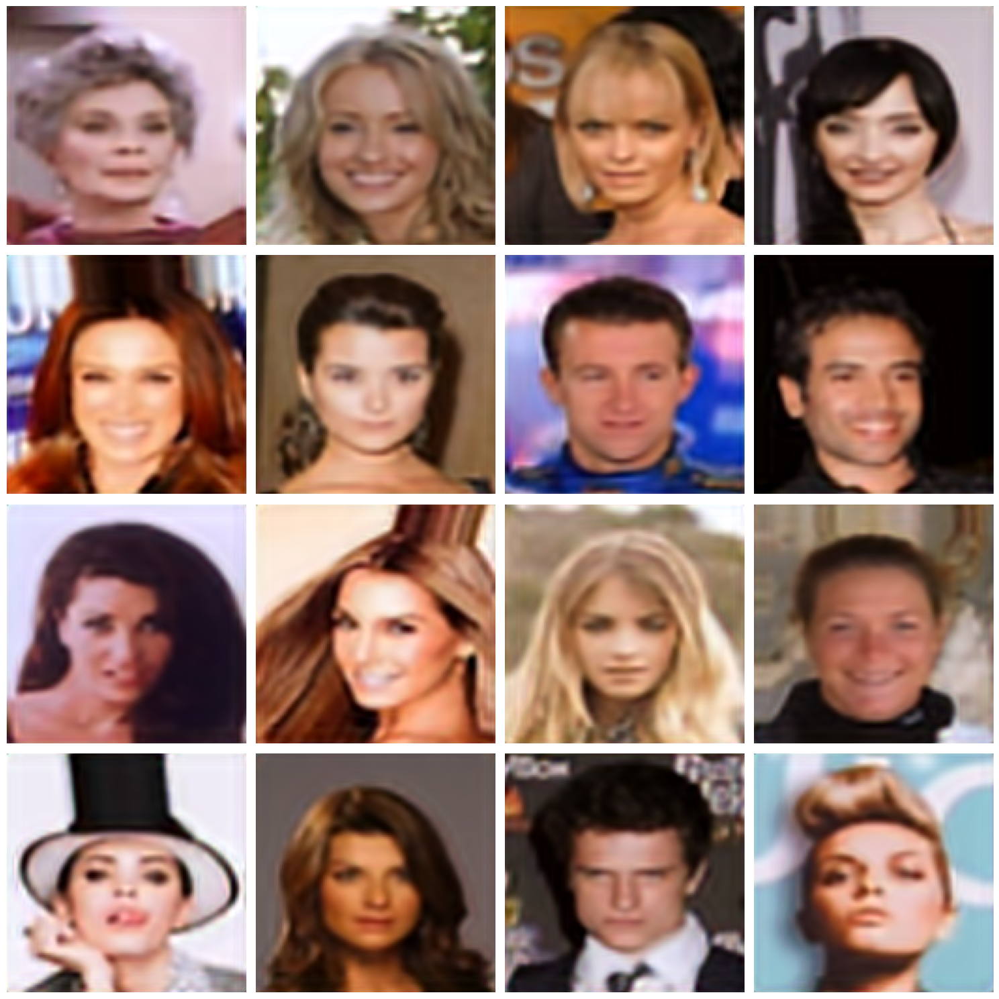

In [13]:
model.eval()
batch,gt_img = next(iter(testloader))
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)
with torch.no_grad():
    out = model(batch.to(device)).cpu().detach()
imshow_grid(out)

## **Hyperparameter Grid Search with Raytune**

*If you have access to APEX, I would recommend converting this part into a Python file and submitting the job to run on APEX using SBATCH. This process may take a considerable amount of time.*

You can import additional Ray Tune tools as you want, such as schedulers, search algorithms, etc. Further information on the usage of Ray Tune can be found [here](https://docs.ray.io/en/latest/tune/index.html).

In [6]:
import ray
from ray import tune, air
from ray.air import session


ray.shutdown()

c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-09-07 14:19:20,201	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-09-07 14:19:21,284	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Complete the `train_raytune()` function below, following the [quick start guide](https://docs.ray.io/en/latest/tune/index.html). This function will be passed to the `tune.Tuner`.

In [7]:
### START CODE HERE ###
def train_raytune(config):



    trainloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True)
    testloader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = Autoencoder(channels=config['channels']).to(device)
    loss_fn = nn.MSELoss()

    if config['optimizer'] == 'Adam':
        opt = optim.Adam(model.parameters(), lr=config['lr'])
    elif config['optimizer'] == 'SGD':
        opt = optim.SGD(model.parameters(), lr=config['lr'])
    
    for epoch in range(config['num_epochs']):
        model.train()
        avg_train_loss = 0.0
        avg_test_loss = 0.0
        for images, gt_images in trainloader:
            images, gt_images = images.to(device), gt_images.to(device)
            opt.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, gt_images)
            loss.backward()
            opt.step()
            avg_train_loss += loss.item() * images.size(0)
        avg_train_loss /= len(trainloader)

        total_pnsr = 0.0
        total_ssim = 0.0
        model.eval()
        for images, gt_images in testloader:
            images, gt_images = images.to(device), gt_images.to(device)
            with torch.no_grad():
                outputs = model(images)
                loss = loss_fn(outputs, gt_images)
                avg_test_loss += loss.item() * images.size(0)
                # Calculate PSNR and SSIM
                for i in range(images.size(0)):
                    output_img = outputs[i].cpu().numpy().transpose(1, 2, 0)
                    gt_img = gt_images[i].cpu().numpy().transpose(1, 2, 0)
                    total_pnsr += psnr(gt_img, output_img, data_range=1.0)
                    total_ssim += ssim(gt_img, output_img, data_range=1.0, channel_axis=2)

        avg_test_loss /= len(testloader)
        avg_pnsr = total_pnsr / len(testloader)
        avg_ssim = total_ssim / len(testloader)

        session.report({
            "train_loss": avg_train_loss,
            "val_loss": avg_test_loss,
            "val_psnr": avg_pnsr,
            "val_ssim": avg_ssim,
        })
        
### END CODE HERE ###

Initialize Ray, define the search space, and resources.

Resource : 
- [A Guide To Parallelism and Resources for Ray Tune](https://docs.ray.io/en/latest/tune/tutorials/tune-resources.html#:~:text=A%20Guide%20To%20Parallelism%20and%20Resources%20for%20Ray%20Tune) 
- [Working with Tune Search Spaces](https://docs.ray.io/en/latest/tune/tutorials/tune-search-spaces.html#tune-search-space-tutorial:~:text=Working%20with%20Tune%20Search%20Spaces)
- [How to configure logging in Tune?](https://docs.ray.io/en/latest/tune/tutorials/tune-output.html) 
- [Tune Trial Schedulers (`tune.schedulers`)](https://docs.ray.io/en/latest/tune/api/schedulers.html#tune-scheduler-pbt:~:text=Tune%20Trial...-,Tune%20Trial%20Schedulers%20(tune.schedulers),-%23)

**Search Space:**
- `architecture`:<br>
    Feature map dimensions for convolutional layers<br>
    - `[32, 64, 128]`: 3 downsampling layers with feature maps increasing from 32 to 128.
    - `[64, 128, 256]`: 3 downsampling layers with feature maps starting from 64 to 256.
    - `[64, 128, 256, 512]`: 4 downsampling layers with more depth, starting from 64 and ending at 512.
- `learning rates (lr)`:
    - [1e-3, 8e-4, 1e-4, 1e-2]: Test a wide range of learning rates to evaluate model performance, from 1e-3 (typical) to a more aggressive 1e-2 or conservative 1e-4.
- `batch size`:
    - [16, 32]: Explore smaller batch sizes to evaluate their impact on gradient estimation and memory usage.
- `number of epochs`:
    - `[10, 50, 100]`: Allow short and long training sessions, from quick evaluations (10 epochs) to more extensive training (100 epochs).
- `optimizers (opts)`:
    - `["Adam", "SGD"]`: Compare two popular optimization algorithms: Adam for adaptive learning rates and SGD for momentum-based updates.

In [21]:
ray.shutdown()

In [ ]:
### START CODE HERE ###
ray.init(num_gpus=1,)
config = {
    'channels': tune.grid_search([[32, 64, 128], [64,128,256], [64, 128, 256, 512]]),
    'batch_size': tune.grid_search([16, 32]),
    'optimizer': tune.grid_search(['Adam', 'SGD']),
    'lr': tune.grid_search([1e-3, 8e-4, 1e-4, 1e-2]),
    'num_epochs': tune.grid_search([10, 50, 100])
}
from ray.tune import RunConfig

def short_trial_name(trial):
    return f"trial_{trial.trial_id}"

from ray.tune import TuneConfig

tuner = tune.Tuner(
    tune.with_resources(
        train_raytune,
        resources={ "gpu": 0.33}
    ),
    param_space=config,
    run_config=RunConfig(
        storage_path=os.path.abspath("./ray_results")
    ),
    tune_config=TuneConfig(
        trial_dirname_creator=short_trial_name,
        metric="val_psnr",
        mode='max',
    )
)

result = tuner.fit()

### END CODE HERE ###

(train_raytune pid=19060) Using device: cuda


(train_raytune pid=17388) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=17388)   _log_deprecation_warning(


(train_raytune pid=22852) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=21812) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 3x across cluster]
(train_raytune pid=21812)   _log_deprecation_warning( [repeated 3x across cluster]
(train_raytune pid=22672) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=22672)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=16772) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=16772) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=16772)   _log_deprecation_warning(
(train_raytune pid=24188) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24188)   _log_deprecation_warning(


(train_raytune pid=11368) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=11368) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=11368)   _log_deprecation_warning(
(train_raytune pid=8072) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8072)   _log_deprecation_warning(


(train_raytune pid=23172) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=23172) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=23172)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=6196) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=6196) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=6196)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=24044) Using device: cuda
(train_raytune pid=8516) Using device: cuda


(train_raytune pid=8516) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8516)   _log_deprecation_warning(
(train_raytune pid=24044) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24044)   _log_deprecation_warning(


(train_raytune pid=7008) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=7008) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=7008)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=18168) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=18168) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 3x across cluster]
(train_raytune pid=18168)   _log_deprecation_warning( [repeated 3x across cluster]


(train_raytune pid=15744) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=15744) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 3x across cluster]
(train_raytune pid=15744)   _log_deprecation_warning( [repeated 3x across cluster]
(train_raytune pid=25444) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=25444)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=2884) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=2884) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=2884)   _log_deprecation_warning(


(train_raytune pid=3200) Using device: cuda
(train_raytune pid=26408) Using device: cuda


(train_raytune pid=3200) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=3200)   _log_deprecation_warning(


(train_raytune pid=11612) Using device: cuda


(train_raytune pid=11612) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=11612)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=23840) Using device: cuda


(train_raytune pid=23840) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23840)   _log_deprecation_warning(
(train_raytune pid=11572) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=11572)   _log_deprecation_warning(


(train_raytune pid=19444) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=19444) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=19444)   _log_deprecation_warning(
(train_raytune pid=11280) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=11280)   _log_deprecation_warning(


(train_raytune pid=11648) Using device: cuda [repeated 3x across cluster]


(train_raytune pid=27656) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=27656)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=23648) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=23648) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=23648)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=4404) Using device: cuda


(train_raytune pid=4404) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4404)   _log_deprecation_warning(


(train_raytune pid=7216) Using device: cuda


(train_raytune pid=7216) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=7216)   _log_deprecation_warning(


(train_raytune pid=14288) Using device: cuda


(train_raytune pid=14288) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=14288)   _log_deprecation_warning(


(train_raytune pid=26800) Using device: cuda


(train_raytune pid=26800) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26800)   _log_deprecation_warning(


(train_raytune pid=23848) Using device: cuda


(train_raytune pid=23848) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23848)   _log_deprecation_warning(


(train_raytune pid=25988) Using device: cuda


(train_raytune pid=25988) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=25988)   _log_deprecation_warning(


(train_raytune pid=6188) Using device: cuda


(train_raytune pid=6188) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=6188)   _log_deprecation_warning(


(train_raytune pid=19416) Using device: cuda


(train_raytune pid=19416) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=19416)   _log_deprecation_warning(


(train_raytune pid=9964) Using device: cuda


(train_raytune pid=9964) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=9964)   _log_deprecation_warning(


(train_raytune pid=20384) Using device: cuda


(train_raytune pid=20384) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=20384)   _log_deprecation_warning(


(train_raytune pid=3192) Using device: cuda


(train_raytune pid=3192) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=3192)   _log_deprecation_warning(


(train_raytune pid=3728) Using device: cuda


(train_raytune pid=3728) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=3728)   _log_deprecation_warning(


(train_raytune pid=26396) Using device: cuda


(train_raytune pid=26396) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26396)   _log_deprecation_warning(


(train_raytune pid=17276) Using device: cuda


(train_raytune pid=17276) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=17276)   _log_deprecation_warning(


(train_raytune pid=272) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=272) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=272)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=27096) Using device: cuda


(train_raytune pid=27096) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=27096)   _log_deprecation_warning(


(train_raytune pid=1248) Using device: cuda


(train_raytune pid=1248) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=1248)   _log_deprecation_warning(


(train_raytune pid=11500) Using device: cuda


(train_raytune pid=11500) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=11500)   _log_deprecation_warning(


(train_raytune pid=4876) Using device: cuda


(train_raytune pid=4876) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4876)   _log_deprecation_warning(


(train_raytune pid=2232) Using device: cuda


(train_raytune pid=2232) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=2232)   _log_deprecation_warning(


(train_raytune pid=10208) Using device: cuda


(train_raytune pid=10208) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=10208)   _log_deprecation_warning(


(train_raytune pid=17588) Using device: cuda


(train_raytune pid=17588) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=17588)   _log_deprecation_warning(


(train_raytune pid=14092) Using device: cuda


(train_raytune pid=14092) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=14092)   _log_deprecation_warning(


(train_raytune pid=8924) Using device: cuda


(train_raytune pid=8924) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8924)   _log_deprecation_warning(


(train_raytune pid=22824) Using device: cuda


(train_raytune pid=22824) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=22824)   _log_deprecation_warning(


(train_raytune pid=25380) Using device: cuda


(train_raytune pid=25380) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=25380)   _log_deprecation_warning(


(train_raytune pid=4268) Using device: cuda


(train_raytune pid=4268) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4268)   _log_deprecation_warning(


(train_raytune pid=18256) Using device: cuda


(train_raytune pid=18256) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=18256)   _log_deprecation_warning(


(train_raytune pid=13652) Using device: cuda


(train_raytune pid=13652) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=13652)   _log_deprecation_warning(


(train_raytune pid=16264) Using device: cuda


(train_raytune pid=16264) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=16264)   _log_deprecation_warning(


(train_raytune pid=8168) Using device: cuda


(train_raytune pid=8168) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8168)   _log_deprecation_warning(


(train_raytune pid=18912) Using device: cuda


(train_raytune pid=18912) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=18912)   _log_deprecation_warning(


(train_raytune pid=21704) Using device: cuda


(train_raytune pid=21704) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=21704)   _log_deprecation_warning(


(train_raytune pid=13172) Using device: cuda


(train_raytune pid=13172) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=13172)   _log_deprecation_warning(


(train_raytune pid=17012) Using device: cuda


(train_raytune pid=17012) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=17012)   _log_deprecation_warning(


(train_raytune pid=12804) Using device: cuda


(train_raytune pid=12804) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=12804)   _log_deprecation_warning(


(train_raytune pid=16692) Using device: cuda


(train_raytune pid=16692) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=16692)   _log_deprecation_warning(


(train_raytune pid=16940) Using device: cuda


(train_raytune pid=16940) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=16940)   _log_deprecation_warning(


(train_raytune pid=2320) Using device: cuda


(train_raytune pid=2320) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=2320)   _log_deprecation_warning(


(train_raytune pid=23684) Using device: cuda


(train_raytune pid=23684) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23684)   _log_deprecation_warning(


(train_raytune pid=20136) Using device: cuda


(train_raytune pid=20136) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=20136)   _log_deprecation_warning(


(train_raytune pid=28172) Using device: cuda


(train_raytune pid=28172) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=28172)   _log_deprecation_warning(


(train_raytune pid=2160) Using device: cuda


(train_raytune pid=2160) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=2160)   _log_deprecation_warning(


(train_raytune pid=19496) Using device: cuda


(train_raytune pid=19496) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=19496)   _log_deprecation_warning(


(train_raytune pid=4900) Using device: cuda


(train_raytune pid=4900) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4900)   _log_deprecation_warning(


(train_raytune pid=19372) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=19372) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=19372)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=19148) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=19148) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=19148)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=26940) Using device: cuda


(train_raytune pid=26940) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26940)   _log_deprecation_warning(


(train_raytune pid=8884) Using device: cuda


(train_raytune pid=8884) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8884)   _log_deprecation_warning(


(train_raytune pid=23064) Using device: cuda


(train_raytune pid=23064) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23064)   _log_deprecation_warning(


(train_raytune pid=14460) Using device: cuda


(train_raytune pid=14460) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=14460)   _log_deprecation_warning(


(train_raytune pid=4700) Using device: cuda


(train_raytune pid=4700) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4700)   _log_deprecation_warning(


(train_raytune pid=28208) Using device: cuda


(train_raytune pid=28208) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=28208)   _log_deprecation_warning(


(train_raytune pid=17672) Using device: cuda


(train_raytune pid=17672) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=17672)   _log_deprecation_warning(


(train_raytune pid=23928) Using device: cuda


(train_raytune pid=23928) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23928)   _log_deprecation_warning(


(train_raytune pid=23372) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=23372) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=23372)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=5876) Using device: cuda


(train_raytune pid=5876) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=5876)   _log_deprecation_warning(


(train_raytune pid=28624) Using device: cuda


(train_raytune pid=28624) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=28624)   _log_deprecation_warning(
(train_raytune pid=18024) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=18024)   _log_deprecation_warning(


(train_raytune pid=27180) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=27180) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=27180)   _log_deprecation_warning(


(train_raytune pid=9672) Using device: cuda


(train_raytune pid=9672) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=9672)   _log_deprecation_warning(


(train_raytune pid=21320) Using device: cuda


(train_raytune pid=21320) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=21320)   _log_deprecation_warning(


(train_raytune pid=4820) Using device: cuda


(train_raytune pid=4820) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=4820)   _log_deprecation_warning(


(train_raytune pid=10064) Using device: cuda


(train_raytune pid=10064) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=10064)   _log_deprecation_warning(


(train_raytune pid=24720) Using device: cuda


(train_raytune pid=24720) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24720)   _log_deprecation_warning(


(train_raytune pid=3436) Using device: cuda


(train_raytune pid=3436) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=3436)   _log_deprecation_warning(


(train_raytune pid=5840) Using device: cuda


(train_raytune pid=5840) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=5840)   _log_deprecation_warning(


(train_raytune pid=27760) Using device: cuda


(train_raytune pid=27760) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=27760)   _log_deprecation_warning(


(train_raytune pid=1284) Using device: cuda


(train_raytune pid=1284) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=1284)   _log_deprecation_warning(


(train_raytune pid=18980) Using device: cuda


(train_raytune pid=18980) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=18980)   _log_deprecation_warning(


(train_raytune pid=19764) Using device: cuda
(train_raytune pid=21028) Using device: cuda


(train_raytune pid=21028) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=21028)   _log_deprecation_warning(
(train_raytune pid=19764) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=19764)   _log_deprecation_warning(


(train_raytune pid=21264) Using device: cuda


(train_raytune pid=21264) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=21264)   _log_deprecation_warning(


(train_raytune pid=24380) Using device: cuda


(train_raytune pid=24380) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24380)   _log_deprecation_warning(


(train_raytune pid=20824) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=20824) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=20824)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=26144) Using device: cuda


(train_raytune pid=26144) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26144)   _log_deprecation_warning(


(train_raytune pid=18500) Using device: cuda


(train_raytune pid=18500) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=18500)   _log_deprecation_warning(


(train_raytune pid=22968) Using device: cuda


(train_raytune pid=22968) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=22968)   _log_deprecation_warning(


(train_raytune pid=24744) Using device: cuda


(train_raytune pid=24744) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24744)   _log_deprecation_warning(


(train_raytune pid=26572) Using device: cuda


(train_raytune pid=26572) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26572)   _log_deprecation_warning(


(train_raytune pid=13940) Using device: cuda


(train_raytune pid=13940) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=13940)   _log_deprecation_warning(


(train_raytune pid=25960) Using device: cuda [repeated 2x across cluster]


(train_raytune pid=25960) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 2x across cluster]
(train_raytune pid=25960)   _log_deprecation_warning( [repeated 2x across cluster]


(train_raytune pid=10916) Using device: cuda


(train_raytune pid=10916) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=10916)   _log_deprecation_warning(


(train_raytune pid=7468) Using device: cuda


(train_raytune pid=7468) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=7468)   _log_deprecation_warning(


(train_raytune pid=9700) Using device: cuda
(train_raytune pid=26416) Using device: cuda


(train_raytune pid=9700) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=9700)   _log_deprecation_warning(
(train_raytune pid=26416) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=26416)   _log_deprecation_warning(


(train_raytune pid=24596) Using device: cuda


(train_raytune pid=24596) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=24596)   _log_deprecation_warning(


(train_raytune pid=8700) Using device: cuda


(train_raytune pid=8700) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=8700)   _log_deprecation_warning(


(train_raytune pid=25868) Using device: cuda


(train_raytune pid=25868) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=25868)   _log_deprecation_warning(


(train_raytune pid=13720) Using device: cuda


(train_raytune pid=13720) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=13720)   _log_deprecation_warning(


(train_raytune pid=9588) Using device: cuda


(train_raytune pid=9588) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=9588)   _log_deprecation_warning(


(train_raytune pid=23996) Using device: cuda


(train_raytune pid=23996) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23996)   _log_deprecation_warning(


(train_raytune pid=15276) Using device: cuda


(train_raytune pid=15276) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=15276)   _log_deprecation_warning(


(train_raytune pid=9816) Using device: cuda


(train_raytune pid=9816) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=9816)   _log_deprecation_warning(


(train_raytune pid=19104) Using device: cuda


(train_raytune pid=19104) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=19104)   _log_deprecation_warning(


(train_raytune pid=13560) Using device: cuda


(train_raytune pid=13560) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=13560)   _log_deprecation_warning(


(train_raytune pid=28396) Using device: cuda


(train_raytune pid=28396) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=28396)   _log_deprecation_warning(


(train_raytune pid=23172) Using device: cuda


(train_raytune pid=23172) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=23172)   _log_deprecation_warning(


(train_raytune pid=10464) Using device: cuda


(train_raytune pid=10464) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=10464)   _log_deprecation_warning(


(train_raytune pid=20840) Using device: cuda


(train_raytune pid=20840) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=20840)   _log_deprecation_warning(
2025-09-07 12:01:06,041	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to 'd:/Image_Processing/Lab6/ray_results/train_raytune_2025-09-07_10-17-48' in 0.1218s.
2025-09-07 12:01:06,114	INFO tune.py:1041 -- Total run time: 6198.06 seconds (6197.82 seconds for the tuning loop).


Restore the result from path of ray resule directory

In [23]:
### START CODE HERE ###
import os
from ray import tune, air

# Specify the path to the Ray Tune results directory
path = os.path.abspath("./ray_results/train_raytune_2025-09-07_10-17-48")  # Use absolute path

# Restore the Ray Tune tuner from the given path
restored_tuner = tune.Tuner.restore(path, trainable='train_raytune')
### END CODE HERE ###

Get the report from Grid Search to CSV file.

In [24]:
print("🎉[INFO] Training is done!")
print("Best config is:", result.get_best_result().config)
print("Best result is:", result.get_best_result())
df = result.get_dataframe()


🎉[INFO] Training is done!
Best config is: {'channels': [32, 64, 128], 'batch_size': 32, 'optimizer': 'Adam', 'lr': 0.0008, 'num_epochs': 100}
Best result is: Result(
  metrics={'train_loss': 0.1050425519545873, 'val_loss': 0.1065666414797306, 'val_psnr': np.float64(464.9602540374896), 'val_ssim': np.float32(14.257073)},
  path='d:/Image_Processing/Lab6/ray_results/train_raytune_2025-09-07_10-17-48/trial_3ac62_00055',
  filesystem='local',
  checkpoint=None
)


---

Train the Autoencoder models using the best hyperparameter set obtained from the grid search.

In [4]:
data_dir = "./img_align_celeba"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]


train_files, test_files = train_test_split(files[:5000], test_size=0.2, random_state=42)

train_dataset = CustomImageDataset(train_files, gauss_blur=True, gauss_noise=True, p=0.25, noise_factor=0.2, noise_std=0.2)
test_dataset = CustomImageDataset(test_files, gauss_blur=True, gauss_noise=True, p=0.25, noise_factor=0.2, noise_std=0.2)
trainloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [27]:
### START CODE HERE ###
model = Autoencoder(channels=[32,64,128])
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loss_fn = nn.MSELoss()
opt = optim.Adam(model.parameters(), lr=0.0008)
train(model,opt,loss_fn,trainloader,testloader,epochs=100,device=device)


### END CODE HERE ###

🤖Training on cuda


📄Testing: 100%|██████████| 63/63 [00:04<00:00, 13.04batch/s, loss=0.00213]


In [28]:
# save model
path = "./models/grid/grid_model.pth"
torch.save(model.state_dict(), path)

In [10]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loss_fn = nn.MSELoss()
train_cv(lambda: Autoencoder(channels=[32,64,128]), train_dataset, testloader, loss_fn, epochs=100, batch_size=32, lr=0.0008, device=device)

🤖Training on cuda

===== Fold 1 =====


📄Testing: 100%|██████████| 32/32 [00:11<00:00,  2.68batch/s, loss=0.00245]


Fold 1 Test Loss: 8.46937969326973e-05

===== Fold 2 =====


📄Testing: 100%|██████████| 32/32 [00:03<00:00,  8.28batch/s, loss=0.00225]

Fold 2 Test Loss: 7.855564635246991e-05


In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = Autoencoder(channels=[32,64,128])
model.load_state_dict(torch.load("./models/grid/model_fold_1.pth", map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
model.eval()
model = model.to(device)
total_loss = 0.0
num_images = 0
loss_fn = nn.MSELoss()
for images, gt_images in testloader:
    images, gt_images = images.to(device), gt_images.to(device)
    with torch.no_grad():
        outputs = model(images)
    loss = loss_fn(outputs, gt_images)
    total_loss += loss.item() * images.size(0)
    num_images += images.size(0)
print(f"Average test loss: {total_loss / num_images:.4f}")
total_loss = 0.0
num_images = 0
model.load_state_dict(torch.load("./models/grid/model_fold_2.pth", map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
model.eval()
model = model.to(device)
for images, gt_images in testloader:
    images, gt_images = images.to(device), gt_images.to(device)
    with torch.no_grad():
        outputs = model(images)
    loss = loss_fn(outputs, gt_images)
    total_loss += loss.item() * images.size(0)
    num_images += images.size(0)
print(f"Average test loss: {total_loss / num_images:.4f}")

Average test loss: 0.0027
Average test loss: 0.0025


Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers. Then, save it as an image.


In [31]:
import math
class FeatureMapVisualizer:
    def __init__(self, model, layers, save_dir):
        """
        Parameters:
        - model: The PyTorch model
        - layers: A string or list of strings specifying the layer names to visualize
        - save_dir: Directory to save the output feature map images
        """
        self.model = model
        self.layers = layers if isinstance(layers, list) else [layers]
        self.activations = {}
        self.save_dir = save_dir

        os.makedirs(self.save_dir, exist_ok=True)

        self._register_hooks()

    def _register_hooks(self):
        for name, layer in self.model.named_modules():
            if name in self.layers:
                layer.register_forward_hook(self._hook_fn(name))

    def _hook_fn(self, layer_name):
        def hook(module, input, output):
            print(f'Hooking layer: {layer_name}')
            self.activations[layer_name] = output.detach()
        return hook

    def visualize(self, input_paths):
        """
        Pass an input tensor through the model and visualize the activations.
        
        Parameters:
        - input_paths: List of image paths to pass through the model
        """
        
        for img_path in input_paths:
            self.model(img_path)

            for layer_name, activation in self.activations.items():
                print(f'Visualizing and saving layer: {layer_name}')
                self._save_feature_maps(activation, layer_name)

    def _save_feature_maps(self, activation, layer_name):
        ### START CODE HERE ###
        num_channels = activation.shape[1]
        cols = int(math.ceil(math.sqrt(num_channels)))
        rows = int(math.ceil(num_channels / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(2 * cols, 2 * rows))
        for i in range(num_channels):
            ax = axes.flat[i]
            fmap = activation[0, i].cpu().numpy()
            ax.imshow(fmap, cmap='viridis')
            ax.axis('off')
        for i in range(num_channels, len(axes.flat)):
            axes.flat[i].axis('off')
        plt.tight_layout()
        plt.savefig(os.path.join(self.save_dir, f"{layer_name}_feature_maps.png"))
        plt.close(fig)  
        ### END CODE HERE ###

In [41]:
model.named_modules()

<generator object Module.named_modules at 0x000002365BD22960>

In [38]:
### START CODE HERE ###

visualizer = FeatureMapVisualizer(model, layers=['down1', 'down2', 'up1', 'up2'], save_dir='./feature_maps')
visualizer.visualize([batch[2].unsqueeze(0).to('cuda' if torch.cuda.is_available() else 'cpu')])

### END CODE HERE ###

Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down1
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: down2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up2
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Hooking layer: up1
Visualizing and saving layer: down1
Visu

---
## **Hyperparameter Random Search with Raytune**

**Search Space:**

- **`architecture`:**  
    Define the feature map dimensions for convolutional layers:  
    - `[32, 64, 128]`: 3 downsampling layers with feature maps increasing from 32 to 128.
    - `[64, 128, 256]`: 3 downsampling layers with feature maps starting from 64 to 256.
    - `[64, 128, 256, 512]`: 4 downsampling layers with additional depth, starting from 64 and ending at 512.
  
- **`learning rates (lr)`**:  
    A continuous range of learning rates sampled uniformly between `1e-4` and `1e-2`. This allows exploration of different learning rates from conservative (`1e-4`) to more aggressive (`1e-2`) values.

- **`batch size`**:  
    Randomly sample an integer batch size between 16 and 32 (inclusive). This allows testing of smaller batch sizes, which can affect gradient estimation and memory usage.

- **`number of epochs`**:  
    Randomly sample an integer number of epochs between 10 and 100. This allows the model to train for short (e.g., 10 epochs) or extended periods (up to 100 epochs), giving insight into model performance over different training durations.

- **`optimizers (opts)`**:  
    Randomly select between two optimizers:  
    - `"Adam"`: An adaptive learning rate optimizer that generally performs well across various tasks.  
    - `"SGD"`: Stochastic Gradient Descent with momentum, commonly used for large-scale tasks, requiring careful tuning of the learning rate.

***NOTE*** Random search with 80 samples.

In [8]:
data_dir = os.path.abspath("./img_align_celeba")

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]


train_files, test_files = train_test_split(files[:100], test_size=0.2, random_state=42)


train_dataset = CustomImageDataset(train_files, gauss_blur=True, gauss_noise=True, p = 0.30)
test_dataset = CustomImageDataset(test_files, gauss_blur=True, gauss_noise=True, p = 0.30)

In [10]:
ray.shutdown()

In [11]:
### START CODE HERE ###
from ray.tune import RunConfig
from ray.tune import TuneConfig
ray.init(num_gpus=1)
config = {
    "channels": tune.choice([[32, 64, 128], [64, 128, 256], [64, 128, 256, 512]]),
    "lr": tune.uniform(1e-4, 1e-2),
    "batch_size": tune.randint(16, 33),  # randint is inclusive of low, exclusive of high
    "num_epochs": tune.randint(10, 101),
    "optimizer": tune.choice(["Adam", "SGD"])
}
def short_trial_name(trial):
    return f"trial_{trial.trial_id}"

tune_config = tune.TuneConfig(
    num_samples=80,  # Random search with 80 samples
    trial_dirname_creator=short_trial_name,
    metric="val_psnr",
    mode="max"
)

tuner = tune.Tuner(
    tune.with_resources(
        train_raytune,
        resources={ "gpu": 0.33}
    ),
    param_space=config,
    run_config=RunConfig(
        storage_path=os.path.abspath("./ray_results")
    ),
    tune_config=tune_config
)

result = tuner.fit()


### END CODE HERE ###

(train_raytune pid=14812) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454
(train_raytune pid=14812)   _log_deprecation_warning(
(train_raytune pid=6624) c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\ray\train\_internal\session.py:772: RayDeprecationWarning: `ray.train.report` should be switched to `ray.tune.report` when running in a function passed to Ray Tune. This will be an error in the future. See this issue for more context: https://github.com/ray-project/ray/issues/49454 [repeated 3x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/con

In [13]:
print("🎉[INFO] Training is done!")
print("Best config is:", result.get_best_result().config)
print("Best result is:", result.get_best_result())
df = result.get_dataframe()
df.to_csv('./ray_results.csv', index=False)

# ray.shutdown()

🎉[INFO] Training is done!
Best config is: {'channels': [64, 128, 256], 'lr': 0.0006008813247745792, 'batch_size': 31, 'num_epochs': 86, 'optimizer': 'Adam'}
Best result is: Result(
  metrics={'train_loss': 0.18354690462971726, 'val_loss': 0.1542978733778, 'val_psnr': np.float64(431.3249749382054), 'val_ssim': np.float32(13.91995)},
  path='d:/Image_Processing/Lab6/ray_results/train_raytune_2025-09-07_14-22-22/trial_65840_00060',
  filesystem='local',
  checkpoint=None
)


---

Train the Autoencoder models using the best hyperparameter set obtained from the random search.

In [24]:
data_dir ="./img_align_celeba"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]


train_files, test_files = train_test_split(files[:10000], test_size=0.2, random_state=42)

train_dataset = CustomImageDataset(train_files, gauss_blur=True, gauss_noise=True, p = 0.30)
test_dataset = CustomImageDataset(test_files, gauss_blur=True, gauss_noise=True, p = 0.30)

trainloader = DataLoader(train_dataset, batch_size=31, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=31, shuffle=False)

In [15]:
### START CODE HERE ###
model = Autoencoder(channels=[64,128,256])
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loss_fn = nn.MSELoss()
opt = optim.Adam(model.parameters(), lr=0.0006008813247745792)
train(model,opt,loss_fn,trainloader,testloader,epochs=86,device=device)


### END CODE HERE ###

🤖Training on cuda


📄Testing: 100%|██████████| 65/65 [00:08<00:00,  8.08batch/s, loss=0.00326]


In [16]:
path = "./models/random/random_model.pth"
torch.save(model.state_dict(), path)

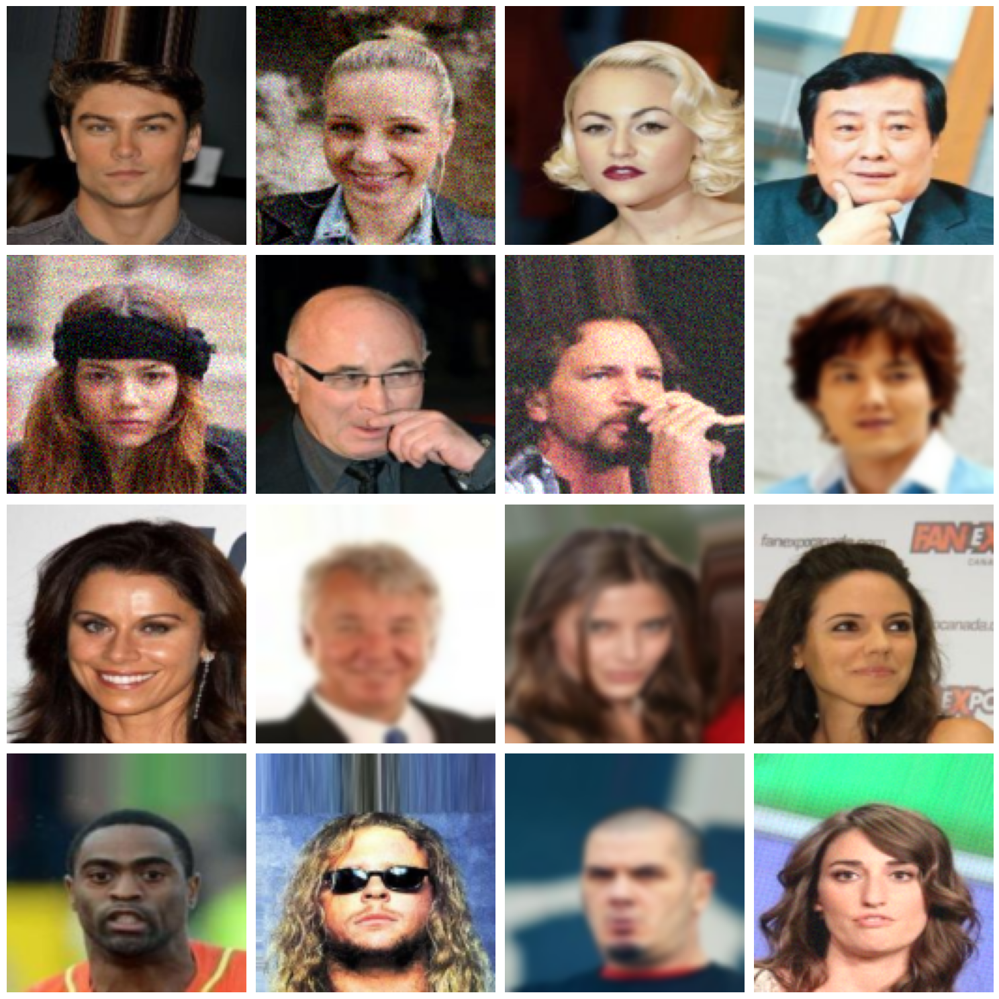

In [18]:
imshow_grid(batch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.068294354..0.85667956].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12558118..1.0069042].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059904143..0.9528942].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04633996..1.0298549].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030189246..0.9694663].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033412054..0.98449075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got rang

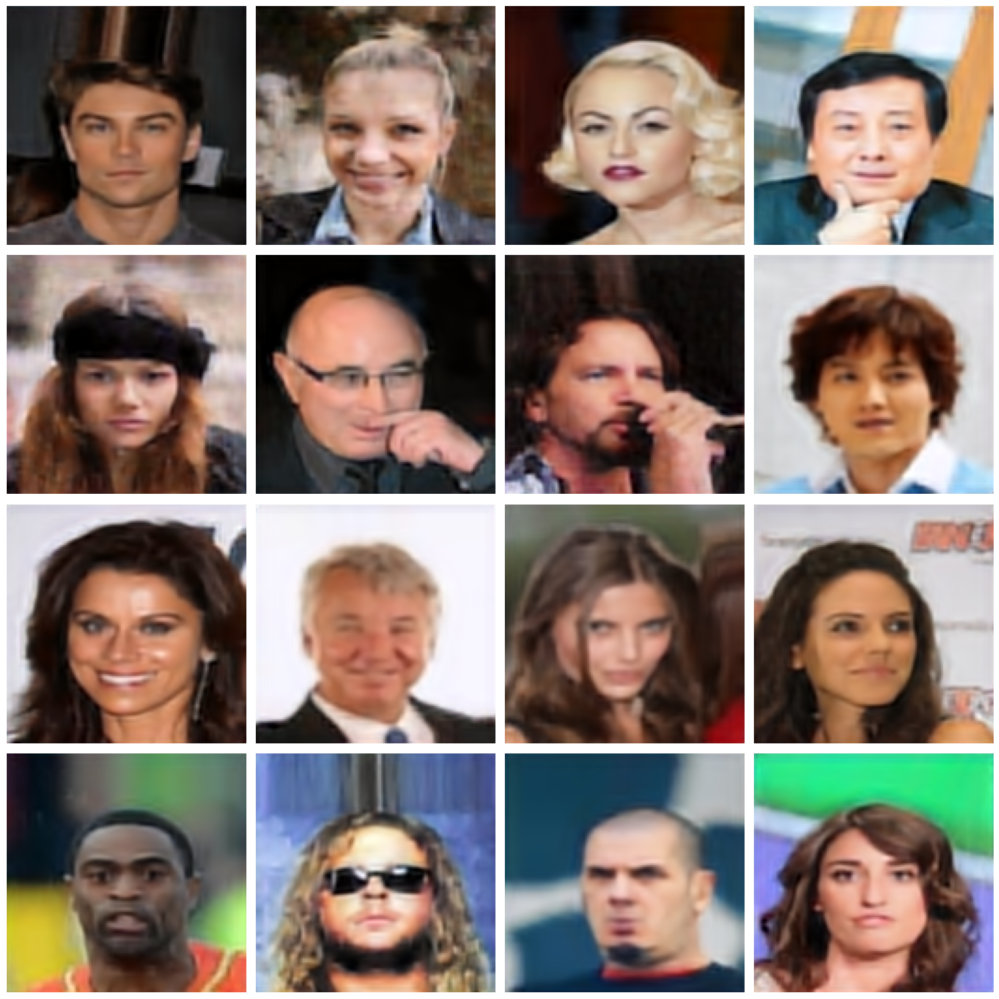

In [17]:
model.eval()
batch,gt_img = next(iter(testloader))
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)
with torch.no_grad():
    out = model(batch.to(device)).cpu().detach()
imshow_grid(out)

Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers of the Convolution Feature Extractor part. Then, save it as an image.

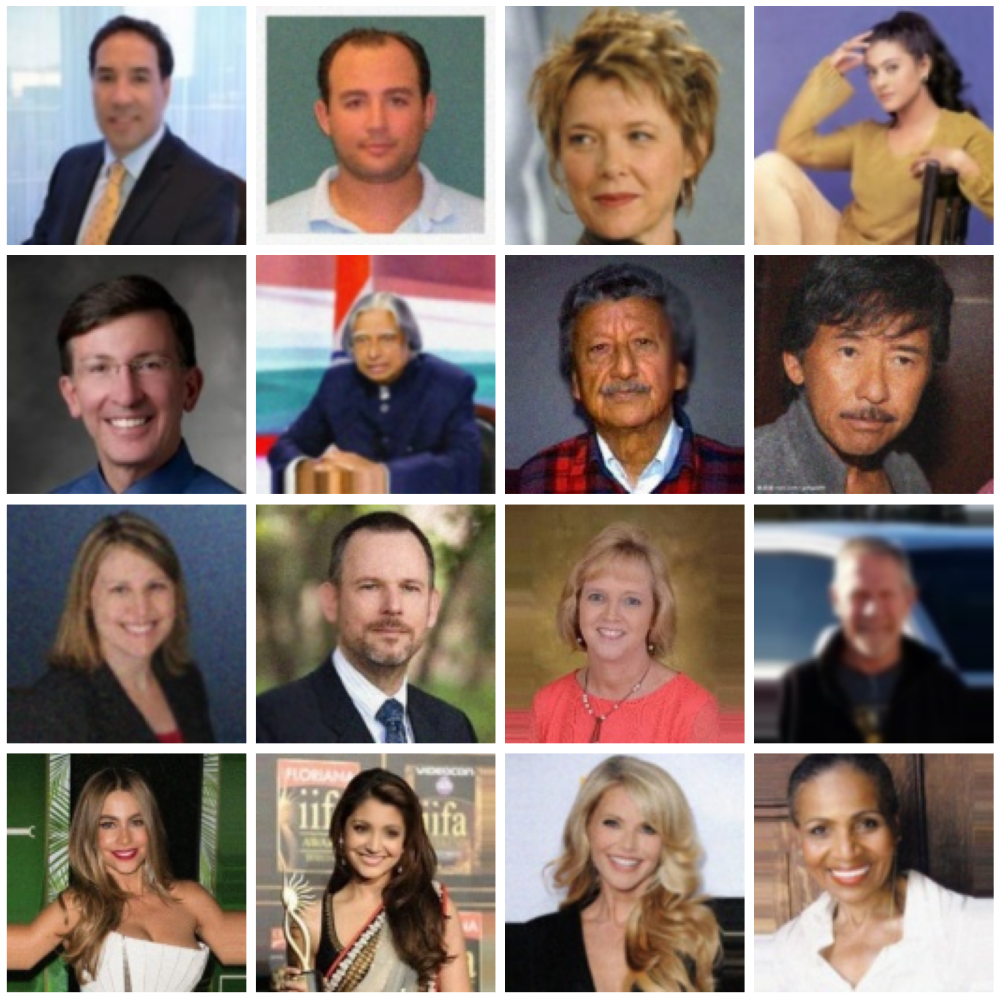

In [28]:
imshow_grid(batch)

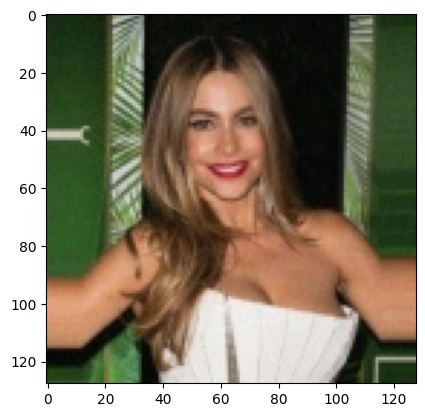

In [29]:
### START CODE HERE ###

plt.imshow(batch[12].permute(1, 2, 0))

### END CODE HERE ###

In [33]:
model.eval()

Autoencoder(
  (input_conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (up2): UpSamplingBlock(
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up

In [32]:
### START CODE HERE ###

visualizer = FeatureMapVisualizer(model=model, layers=['down1', 'down2', 'up1', 'up2'], save_dir='./feature_maps/random')
visualizer.visualize([batch[12].unsqueeze(0).to('cuda' if torch.cuda.is_available() else 'cpu')])


### END CODE HERE ###

Hooking layer: down1
Hooking layer: down2
Hooking layer: up2
Hooking layer: up1
Visualizing and saving layer: down1
Visualizing and saving layer: down2
Visualizing and saving layer: up2
Visualizing and saving layer: up1


---

# Questions

1. How many combinations of hyperparameter values (trials) were evaluated during the hyperparameter tuning process?
2. What are the top 3 best parameters and their corresponding tuning results for the model?
3. Analyze and compare the similarities and differences between the top 3 parameters in terms of model architecture, loss, performance, etc.




# Answer
1. 144 ใน grid search 80 ใน random search
2. ทุกตัวอยู่ใน grid search sessions ids = 55, 30, 32 ใน ray_results/train_raytune_2025-03-07_10-17-48
3. lr = 0.0008 เหมือนกัน, optimizer ใช้ Adam เหมือนกัน, epoch เป็น 50 หรือ 100

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Autoencoder([64, 128, 256])
model.load_state_dict(torch.load("./models/random/random_model.pth"))
model.to(device)

Autoencoder(
  (input_conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (up2): UpSamplingBlock(
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up

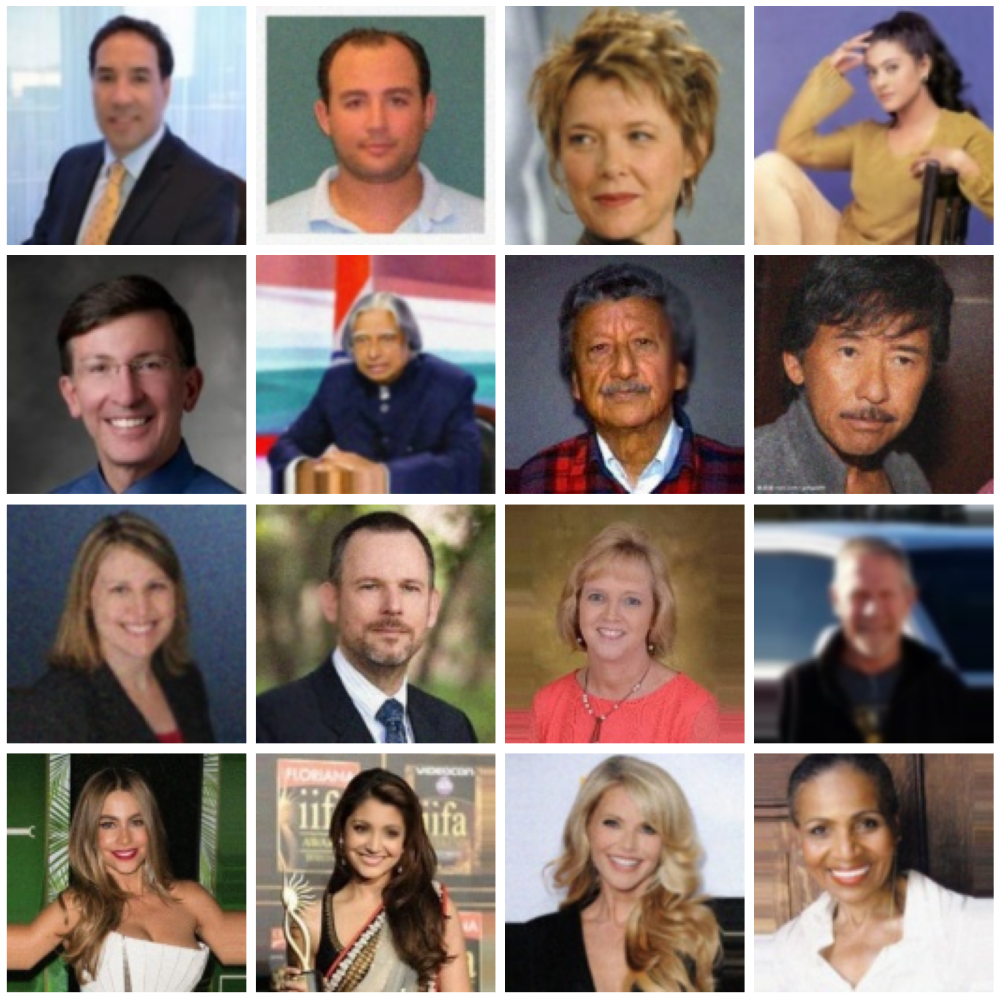

In [8]:
path = "./test"
dataset = CustomImageDataset(image_paths=glob.glob(os.path.join(path, '*.jpg')))
dataloader = DataLoader(dataset, batch_size=32)
batch = next(iter(dataloader))[0]
batch = batch.to(device)
imshow_grid(batch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014352955..1.1000637].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.052479565..1.029017].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01932656..1.0052817].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04795736..0.9278039].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0052089244..1.0572901].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14490592..1.0670962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0

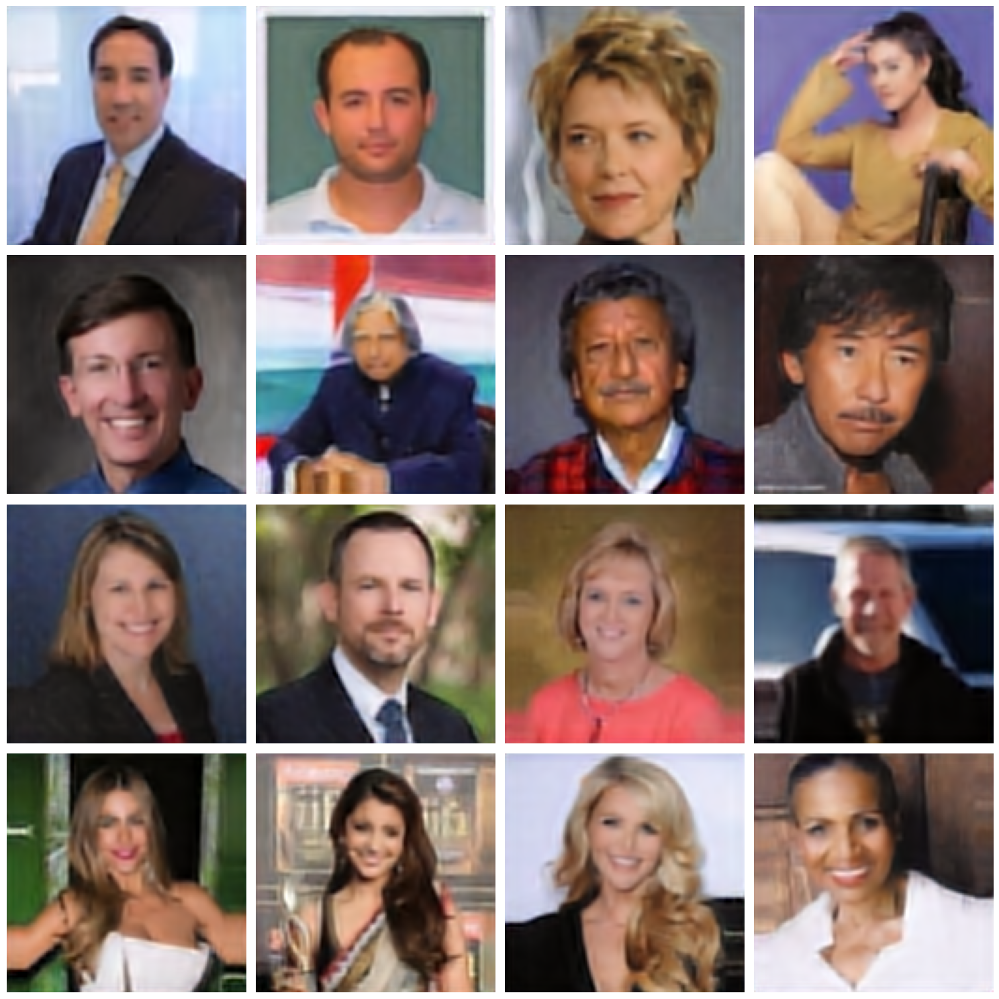

In [13]:
model.eval()
out = model(batch).cpu().detach()
imshow_grid(out)